# Notebook Overview

In this notebook , we will conceptually understand Topological Data Analysis(TDA)and try to perform TDA on metrics which store the distance values of each frame in a video to its 32 support keyframes

# Installing Dependencies

In [ ]:
!pip install giotto_tda

# Importing Necessary Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')

from gtda.homology import VietorisRipsPersistence
from gtda.time_series import SlidingWindow


Mounted at /content/drive


# Gloabl Configuration

In [ ]:
path = '/content/drive/MyDrive/Cow_teats/GH060066_dis_deep.txt'
# Definig the ground truth
key_frames = [425, 950, 1550, 2066, 3132]

In [ ]:
# Loading the deep distance
df = pd.read_csv(path,sep=' ',header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,716.119873,727.356079,753.822449,844.945312,780.308655,747.197815,843.887207,804.595825,802.469849,848.525085,...,727.783936,783.694458,769.488708,812.934326,828.883301,814.967957,813.528076,837.079773,855.739746,1064.968994
1,730.037476,745.536377,762.036377,860.727356,773.478394,795.138367,837.157471,809.459961,804.388000,862.521851,...,722.837524,797.229675,783.389038,836.395386,822.573303,823.004395,811.452026,857.641357,890.131042,1069.000854
2,729.070190,741.973816,765.825806,862.203491,790.784180,763.022705,845.384155,827.264648,802.421997,865.150269,...,726.069031,794.511597,782.627075,833.041626,838.995361,825.551514,811.357056,846.268616,855.464233,1063.179932
3,744.068970,770.242737,783.334351,888.629150,796.824036,789.113708,846.398804,831.489258,814.012817,877.839111,...,725.075989,818.529297,806.746155,864.591858,845.962280,841.214722,825.400024,851.050720,888.292358,1083.436279
4,765.031250,776.135986,809.724548,906.133423,828.628052,773.053406,883.291992,857.601685,833.248108,891.004944,...,760.993286,830.137695,823.682617,875.232056,871.049316,856.794800,851.808472,875.479065,881.930664,1102.037598


This is the DataFrame which stores the deep distance values .Lets look closely at this DataFrame to develop a deeper understanding for the concept.

In [ ]:
# Looking at the basic details
print(f'Shape : {df.shape}')
print(f'Statistics \n : {df.describe([0.05,0.10,0.25,0.50,0.75,0.90,0.99])}')


Shape : (3192, 32)
Statistics 
 :                 0            1            2            3            4   \
count  3192.000000  3192.000000  3192.000000  3192.000000  3192.000000   
mean    918.403904   962.120766   929.558470   958.732123   958.691426   
std     175.006100   139.348813   193.649863   189.842824   180.979230   
min     547.546692   591.751831   523.384155   497.085449   588.406494   
5%      621.265497   738.851691   621.586075   631.987488   654.240774   
10%     671.960254   769.253967   665.256568   685.406372   717.669391   
25%     806.249786   878.046844   787.114914   839.227249   834.112213   
50%     912.947846   957.600769   923.997863   960.376618   945.013489   
75%    1046.739777  1052.605286  1078.734192  1098.992798  1094.931274   
90%    1160.860376  1157.887549  1205.937012  1218.928772  1215.223780   
99%    1295.264108  1268.822484  1322.928933  1335.676183  1334.994302   
max    1380.687012  1340.626709  1406.035400  1392.903809  1407.270630   

   

 Since there are 32 key frames, there are 32 columns. We require only one column for our analysis, so we will be taking the mean of all 32 columns and making a new data structure which will be used for TDA.

In [ ]:
# Taking the mean of all the columns
df_final = df.mean(axis=1)
print(f'DataFrame \n{df_final.head()}\n')
print(f'Shape : {df_final.shape}')

DataFrame 
0    807.698889
1    815.843735
2    816.102102
3    831.816126
4    850.940096
dtype: float64

Shape : (3192,)


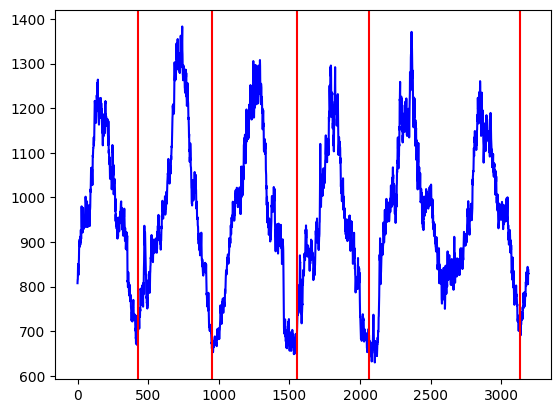

In [ ]:
# Looking at the points in the ground truth on the distplot
plt.plot(np.arange(0,df_final.shape[0]),df_final,color='blue')
for i in key_frames:
  plt.axvline(i,color='red')
plt.show()

Now we have a reference of where the key frames exist. Our goal is to used TDA to extract these frames. We already know that a key frame would have the least distance from the support key frames .

So now let us define our area of interest where there can exist a keyframe.

# Area of Interest Anlysis

# TDA

We will be using the concepts from Topological Data Analysis to see if we can detect the keyframes from the Deep Distance Values . First We will. start by creating a Sliding Window on the deed distance to get 2D data.

In [ ]:
# Implementing Sliding Window on the Data
window_size = 500
stride = 100

SW = SlidingWindow(size=window_size, stride=stride)
X_sw = SW.fit_transform(X)
print(X_sw.shape)

(27, 500, 1)


Now we have sliding windows , which has 500 datapoints in each window and a stride of 100. Lets visualize these Sliding windows .

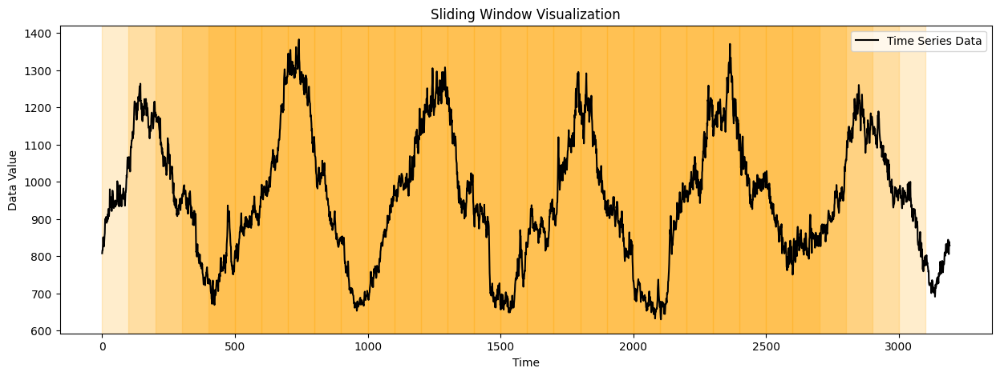

In [ ]:
time_series_length = len(X)
num_windows = (time_series_length - window_size) // stride + 1

plt.figure(figsize=(15, 5))
plt.plot(np.arange(time_series_length), X, 'k-', label='Time Series Data')

# Overlay windows
for i in range(num_windows):
    window_start = i * stride
    window_end = window_start + window_size
    plt.axvspan(window_start, window_end, color='orange', alpha=0.2)

plt.title('Sliding Window Visualization')
plt.xlabel('Time')
plt.ylabel('Data Value')
plt.legend()
plt.show()


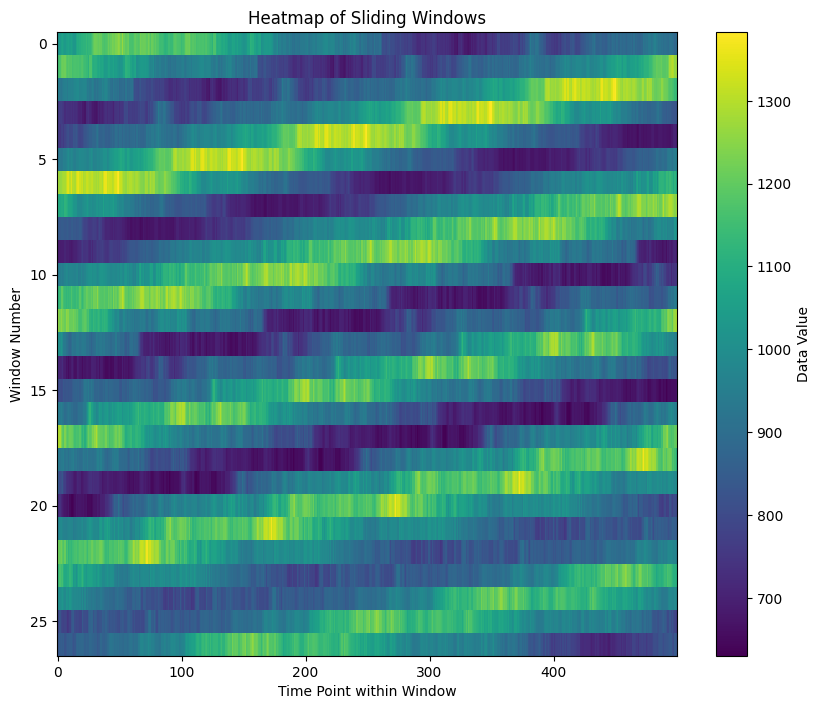

In [ ]:
# Heatmap of the Sliding Windows
plt.figure(figsize=(10, num_windows * 0.3))
plt.imshow(X_sw, aspect='auto', interpolation='nearest')
plt.colorbar(label='Data Value')
plt.xlabel('Time Point within Window')
plt.ylabel('Window Number')
plt.title('Heatmap of Sliding Windows')
plt.show()


In the above heat map of all the windows, we can see the existence of low distance values in some of the windows

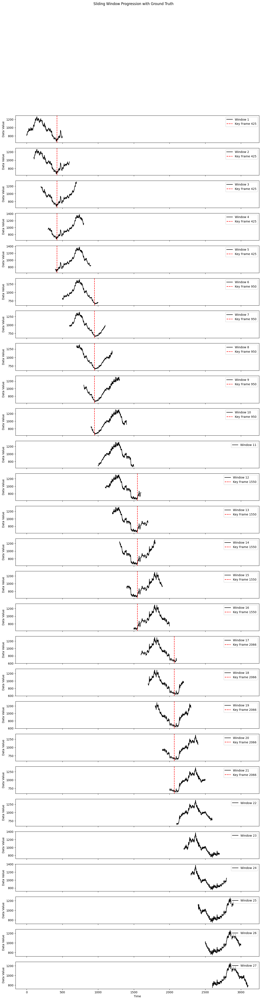

In [ ]:
# Time Series line plot of all the windows
time_series_length = len(X)
num_windows = (time_series_length - window_size) // stride + 1


key_frames = [425, 950, 1550, 2066, 3132]

fig, axs = plt.subplots(num_windows, 1, figsize=(15, 2 * num_windows), sharex=True)

for i in range(num_windows):
    window_start = i * stride
    window_end = window_start + window_size

    window_data = X[window_start:window_end]

    axs[i].plot(np.arange(window_start, window_end), window_data, 'k-', label=f'Window {i+1}')
    # Annotate ground truth
    for kf in key_frames:
        if window_start <= kf < window_end:
            axs[i].axvline(x=kf, color='red', linestyle='--', label=f'Key Frame {kf}')

    axs[i].set_ylabel('Data Value')
    axs[i].legend(loc='upper right')

# Set common labels
plt.xlabel('Time')
fig.suptitle('Sliding Window Progression with Ground Truth')
plt.show()


In [ ]:
# Compute persistence diagrams for the point clouds gathered from the sliding windows
VR = VietorisRipsPersistence(homology_dimensions=[0, 1], coeff=2, infinity_values=None)
diagrams = VR.fit_transform(X_sw)

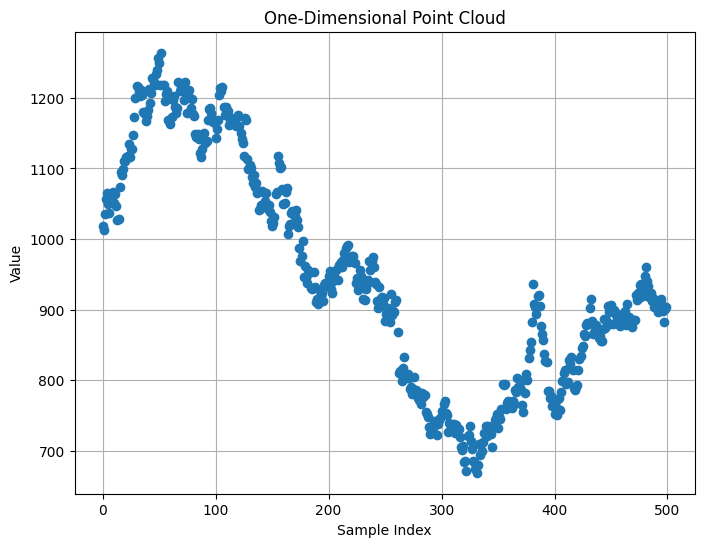

In [ ]:
# Plot the first window
window_to_visualize = 0
point_cloud = X_sw[window_to_visualize]
plt.show()
plt.figure(figsize=(8, 6))
plt.plot(point_cloud, 'o')
plt.title('One-Dimensional Point Cloud')
plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.grid(True)
plt.show()


In [ ]:
# Compute persistence diagrams for the point clouds obtained from the sliding windows
VR = VietorisRipsPersistence(homology_dimensions=[0, 1], coeff=2, infinity_values=None)
diagrams = VR.fit_transform(X_sw)
# Corresponding point cloud.
plot_point_cloud(diagrams[0])

In [ ]:
# Calculate the 75% threshold of the maximum persistence value
persistence_threshold = 0.20 * max_persistence_value

# Find the indices of the features that have a persistence value above the threshold
indices_above_threshold = np.where(persistence > persistence_threshold)[0]

# Extract and print the persistence features above the threshold
features_above_threshold = diagrams[0][indices_above_threshold]
print(f"Indices of features with persistence above 75%: {indices_above_threshold}")
print("Features with persistence above 75%:")
print(features_above_threshold)

Indices of features with persistence above 75%: [420 421 422 423 424 425 426 427 428 429 430 431 432 433 434 435 436 437
 438 439 440 441 442 443 444 445 446 447 448 449 450 451 452 453 454 455
 456 457 458 459 460 461 462 463 464 465 466 467 468 469 470 471 472 473
 474 475 476 477 478 479 480 481 482 483 484 485 486 487 488 489 490 491
 492 493 494 495 496 497 498]
Features with persistence above 75%:
[[ 0.          2.08192635  0.        ]
 [ 0.          2.08851433  0.        ]
 [ 0.          2.09774017  0.        ]
 [ 0.          2.16155434  0.        ]
 [ 0.          2.16639924  0.        ]
 [ 0.          2.17678261  0.        ]
 [ 0.          2.18586731  0.        ]
 [ 0.          2.21380806  0.        ]
 [ 0.          2.23121071  0.        ]
 [ 0.          2.24489975  0.        ]
 [ 0.          2.25612831  0.        ]
 [ 0.          2.28444672  0.        ]
 [ 0.          2.28734589  0.        ]
 [ 0.          2.29984474  0.        ]
 [ 0.          2.40412498  0.        ]
 [ 0.   

array([420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432,
       433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445,
       446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458,
       459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471,
       472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484,
       485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497,
       498])

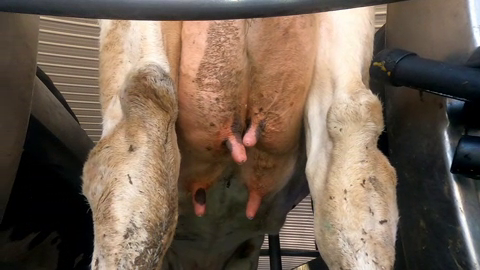

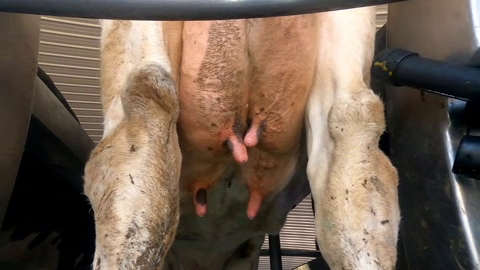

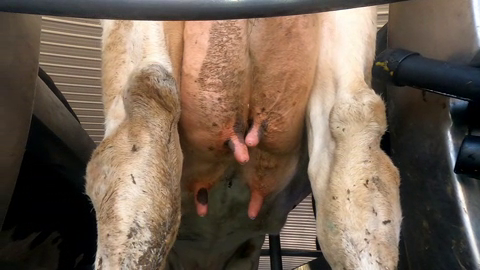

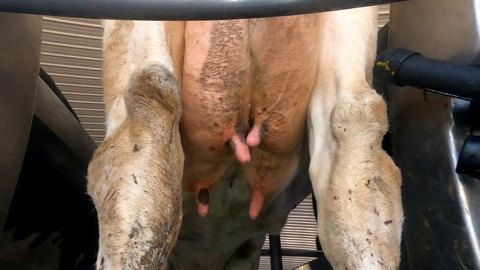

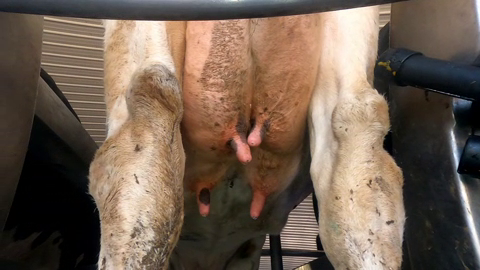

...

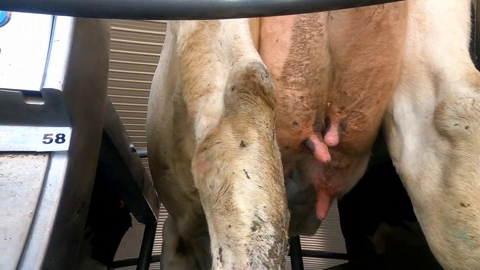

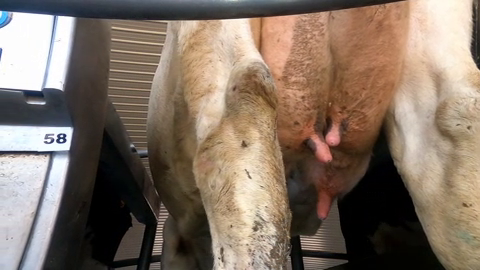

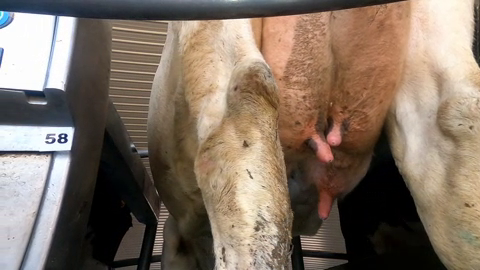

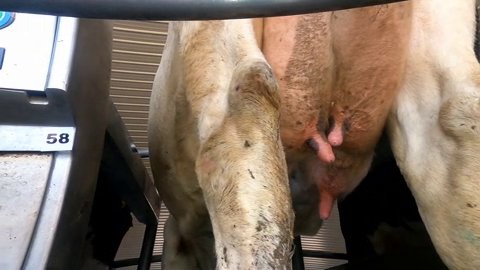

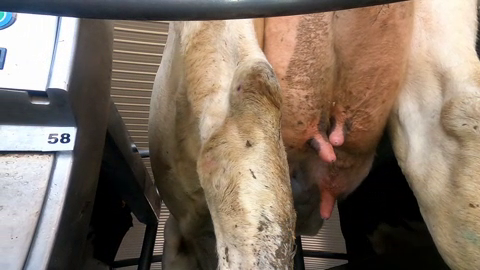

In [ ]:
# Plotting the anomalous frames
frame_number =indices_above_threshold
from google.colab.patches import cv2_imshow
for i in frame_number:
  path = os.path.join('/content/drive/MyDrive/Cow_teats/GH060066_frames',f"frame_{i}.png")
  im = cv2.imread(path)
  cv2_imshow(im)
  plt.show()